# ART Boundary Attack

In [3]:
from __future__ import absolute_import, division, print_function, unicode_literals

import sys
!{sys.executable} -m pip install git+https://github.com/nottombrown/imagenet_stubs
sys.path.append("..")

%matplotlib inline

import imagenet_stubs
import numpy as np
import keras
from tensorflow.keras.utils import load_img, img_to_array

import tensorflow as tf
tf.compat.v1.disable_eager_execution()

from tensorflow.keras.applications.resnet50 import ResNet50, decode_predictions
from keras.layers import Dense, Flatten
from keras.models import Model
import keras.backend as k
from matplotlib import pyplot as plt
from IPython.display import clear_output

from art.estimators.classification import KerasClassifier
from art.attacks.evasion import BoundaryAttack
from art.utils import to_categorical

  Cloning https://github.com/nottombrown/imagenet_stubs to /tmp/pip-req-build-ci04nw6u
  Running command git clone --filter=blob:none --quiet https://github.com/nottombrown/imagenet_stubs /tmp/pip-req-build-ci04nw6u
  Resolved https://github.com/nottombrown/imagenet_stubs to commit 0b501276f54cbf45b8e1b67dccbdcbe51de88365
  Preparing metadata (setup.py) ... done
  Created wheel for imagenet-stubs: filename=imagenet_stubs-0.0.7-py3-none-any.whl size=794798 sha256=bb16d95869486e537050ef0b6db1502c00636d7ab6764aaaa985c057d6f6511c
  Stored in directory: /tmp/pip-ephem-wheel-cache-0tqgzdc1/wheels/11/fe/f6/71c84cfe4ee113c44af28273d506ccbd346c66da9db8688fe6
Successfully built imagenet-stubs


# Model Definition

In [4]:
mean_imagenet = np.zeros([224, 224, 3])
mean_imagenet[..., 0].fill(103.939)
mean_imagenet[..., 1].fill(116.779)
mean_imagenet[..., 2].fill(123.68)
ones_array = np.ones_like(mean_imagenet)
model = ResNet50(weights='imagenet')
classifier = KerasClassifier(clip_values=(0, 255), model=model, preprocessing=(mean_imagenet, ones_array))

Instructions for updating:
Colocations handled automatically by placer.


102967424/102967424 [==============================] - 5s 0us/step


# Get Target and Init Images

In [5]:
def get_image_predictions(image):
    predictions = classifier.predict(np.array([image[..., ::-1]]))
    decoded_predictions = decode_predictions(predictions, top=1)
    class_name = decoded_predictions[0][0][1]
    return class_name

35363/35363 [==============================] - 0s 0us/step
Target image label: 105 koala


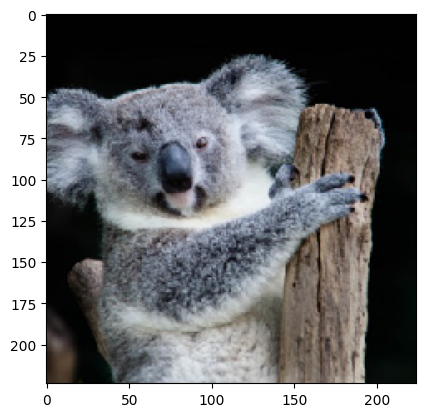

Init image label: 866 tractor


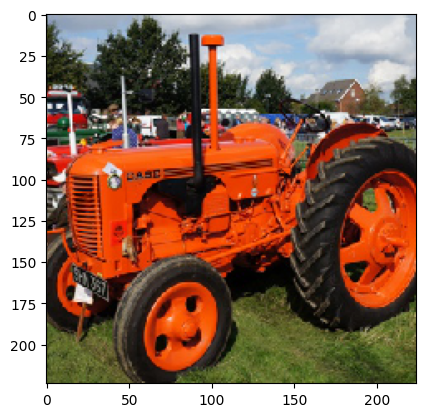

In [6]:
target_image_name = 'koala.jpg'
init_image_name = 'tractor.jpg'

for image_path in imagenet_stubs.get_image_paths():
    if image_path.endswith(target_image_name):
        target_image = load_img(image_path, target_size=(224, 224))
        target_image = img_to_array(target_image)
    if image_path.endswith(init_image_name):
        init_image = load_img(image_path, target_size=(224, 224))
        init_image = img_to_array(init_image)

target_predictions = get_image_predictions(target_image)
init_predictions = get_image_predictions(init_image)

print("Target image label:", np.argmax(classifier.predict(np.array([target_image[..., ::-1]]))[0]), target_predictions)
plt.imshow(target_image.astype(np.uint))
plt.show()

print("Init image label:", np.argmax(classifier.predict(np.array([init_image[..., ::-1]]))[0]), init_predictions)
plt.imshow(init_image.astype(np.uint))
plt.show()

# Boundary Untargeted Attack

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Adversarial image at step 0. L2 error: 42840.88, Class label: 488, Class name: tennis_ball


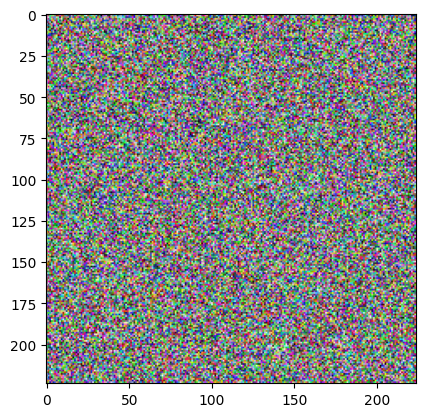

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 200. L2 error: 5521.73, Class label: 359, Class name: koala


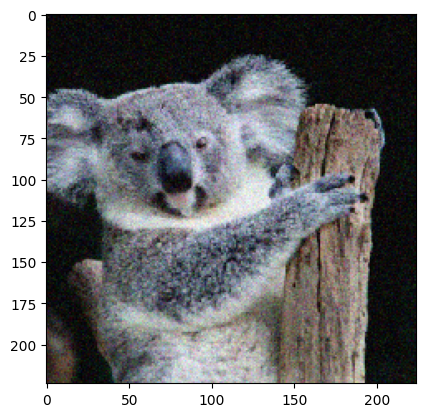

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 400. L2 error: 4025.66, Class label: 359, Class name: koala


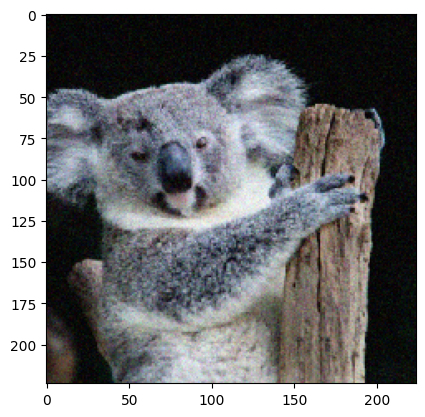

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 600. L2 error: 3286.73, Class label: 359, Class name: koala


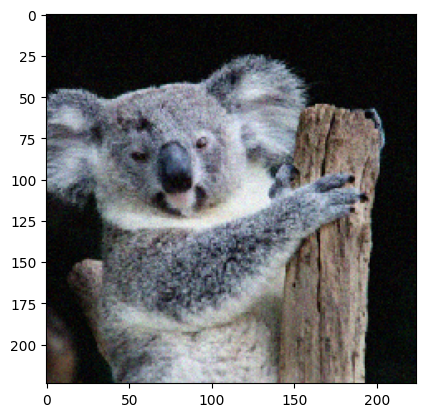

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 800. L2 error: 2681.59, Class label: 356, Class name: koala


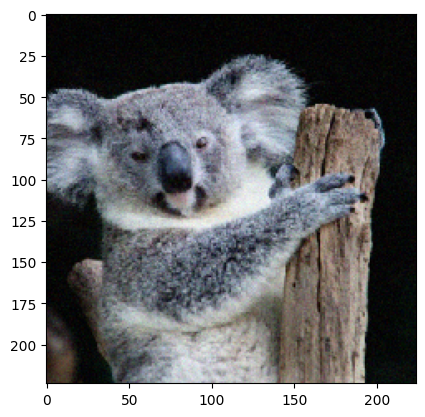

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1000. L2 error: 2274.99, Class label: 356, Class name: koala


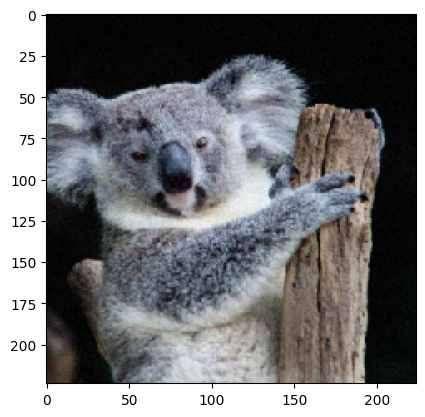

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1200. L2 error: 1967.30, Class label: 356, Class name: koala


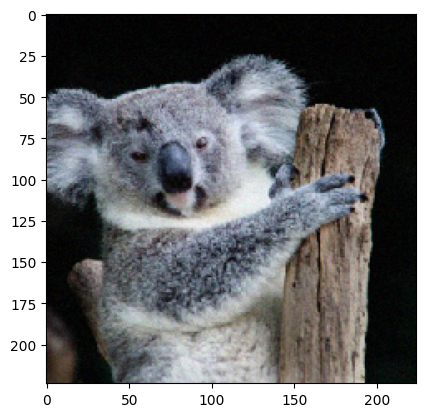

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1400. L2 error: 1778.75, Class label: 356, Class name: koala


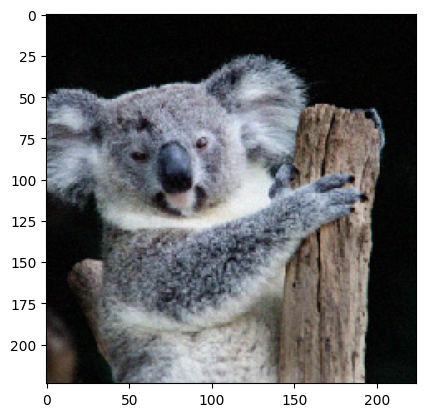

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1600. L2 error: 1624.75, Class label: 356, Class name: koala


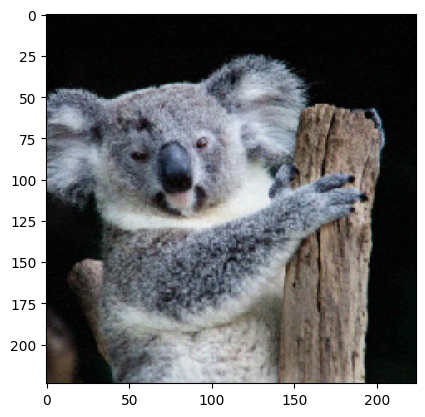

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1800. L2 error: 1502.12, Class label: 356, Class name: koala


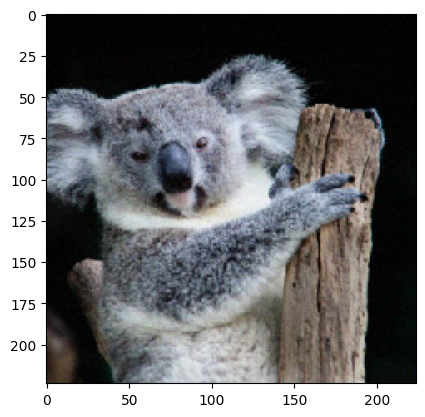

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 2000. L2 error: 1386.44, Class label: 356, Class name: koala


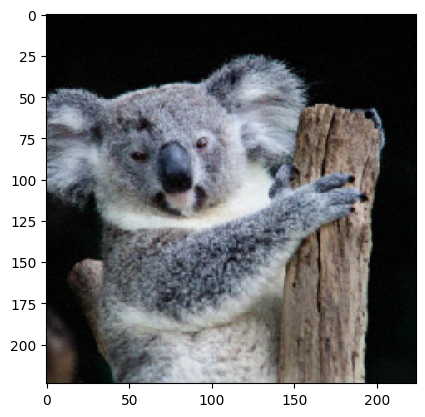

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 2200. L2 error: 1292.33, Class label: 356, Class name: koala


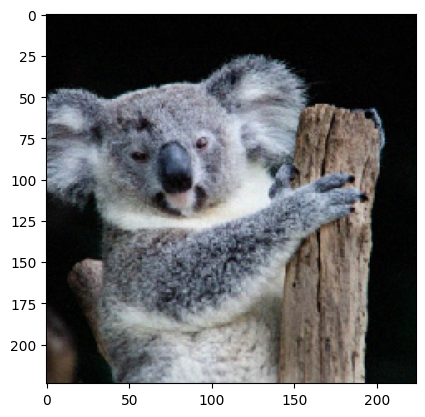

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 2400. L2 error: 1205.31, Class label: 356, Class name: koala


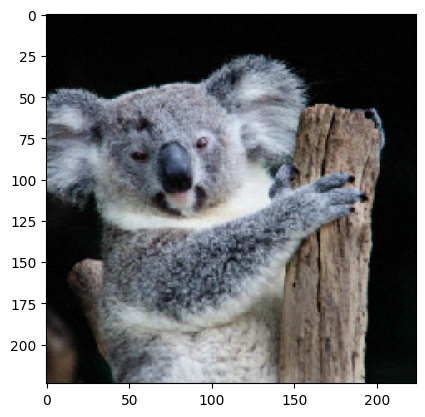

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 2600. L2 error: 1141.38, Class label: 356, Class name: koala


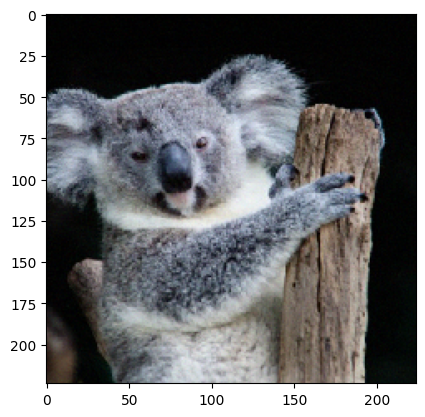

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 2800. L2 error: 1075.71, Class label: 356, Class name: koala


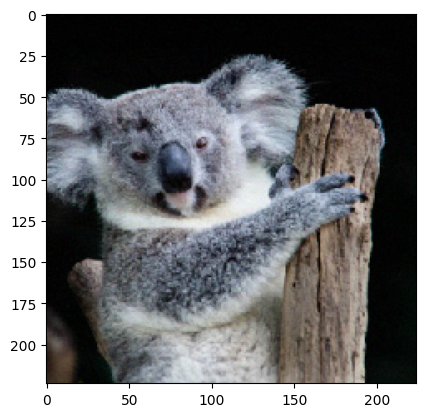

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 3000. L2 error: 1026.05, Class label: 356, Class name: koala


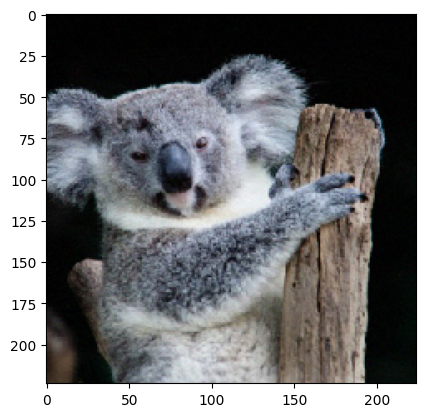

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 3200. L2 error: 975.11, Class label: 356, Class name: koala


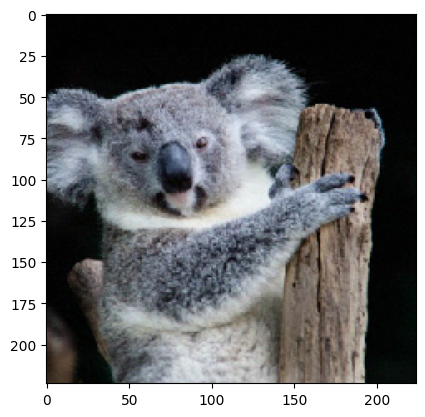

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 3400. L2 error: 936.58, Class label: 356, Class name: koala


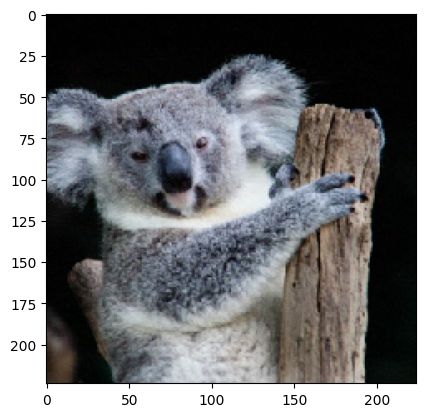

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 3600. L2 error: 899.26, Class label: 356, Class name: koala


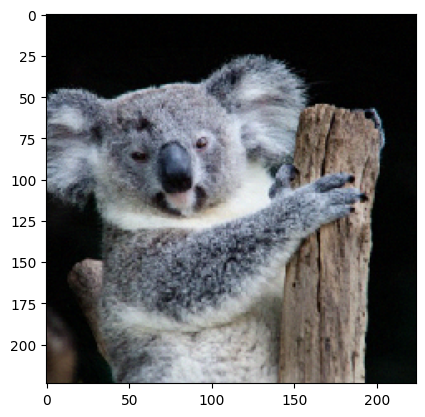

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 3800. L2 error: 866.02, Class label: 356, Class name: koala


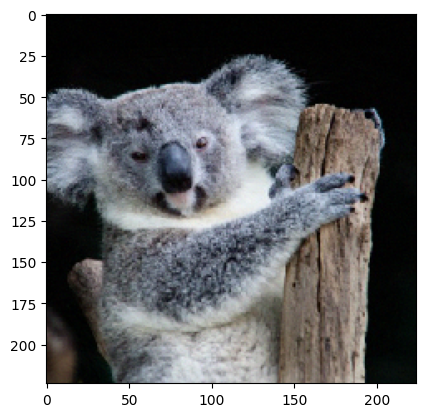

In [9]:
attack = BoundaryAttack(estimator=classifier, targeted=False, max_iter=0, delta=0.001, epsilon=0.001)
iter_step = 200
x_adv = None

for i in range(20):
    x_adv = attack.generate(x=np.array([target_image[..., ::-1]]), x_adv_init=x_adv)

    l2_error = np.linalg.norm(np.reshape(x_adv[0] - target_image[..., ::-1], [-1]))
    class_label = np.argmax(classifier.predict(x_adv)[0])

    # Get the class predictions for the adversarial image
    class_name = get_image_predictions(x_adv[0])

    print("Adversarial image at step %d. L2 error: %.2f, Class label: %d, Class name: %s" %
     (i * iter_step, l2_error, class_label, class_name))

    plt.imshow(x_adv[0][..., ::-1].astype(np.uint))
    plt.show(block=False)

    if hasattr(attack, 'curr_delta') and hasattr(attack, 'curr_epsilon'):
        attack.max_iter = iter_step
        attack.delta = attack.curr_delta
        attack.epsilon = attack.curr_epsilon
    else:
        break

# Boundary Targeted Attack

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Adversarial image at step 0. L2 error: 44399.55, Class label: 866, Class name: tractor


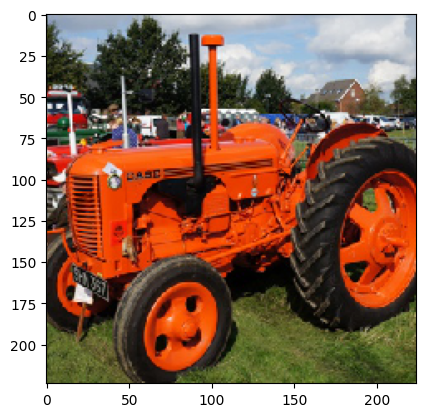

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 200. L2 error: 12219.39, Class label: 866, Class name: koala


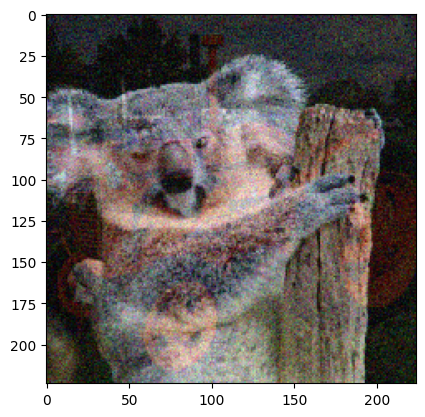

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 400. L2 error: 10036.55, Class label: 866, Class name: koala


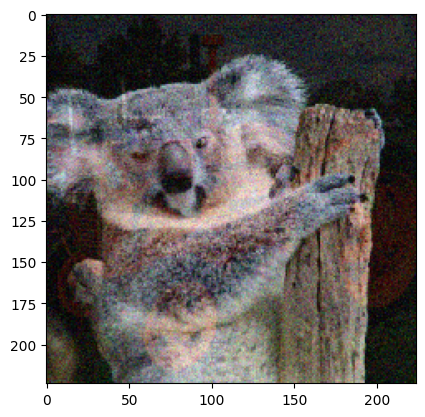

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 600. L2 error: 8378.64, Class label: 866, Class name: koala


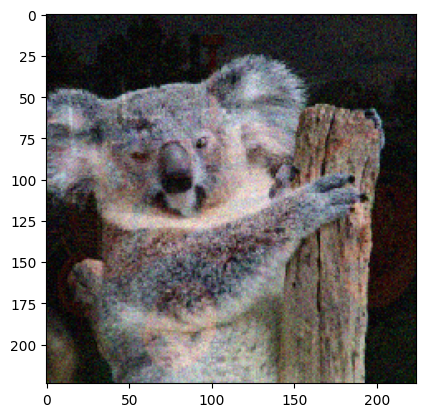

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 800. L2 error: 7526.72, Class label: 866, Class name: koala


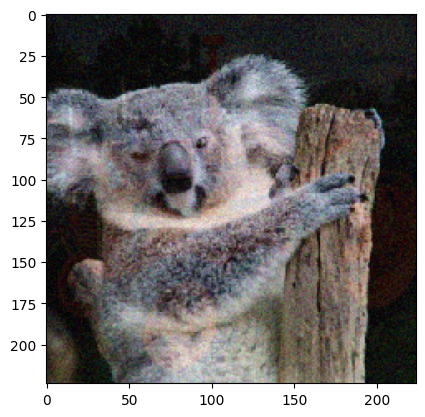

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1000. L2 error: 6599.75, Class label: 866, Class name: koala


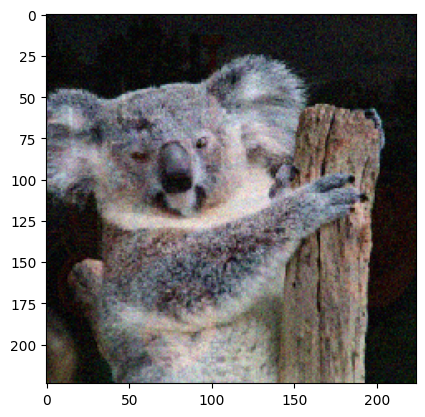

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1200. L2 error: 5964.58, Class label: 866, Class name: koala


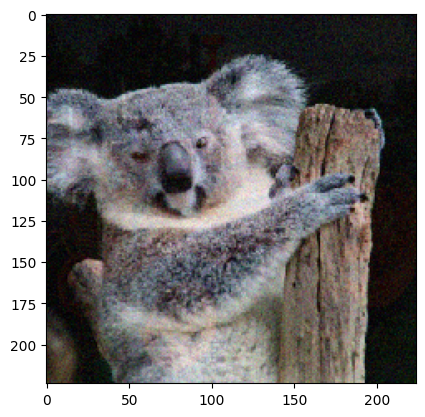

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1400. L2 error: 5264.49, Class label: 866, Class name: koala


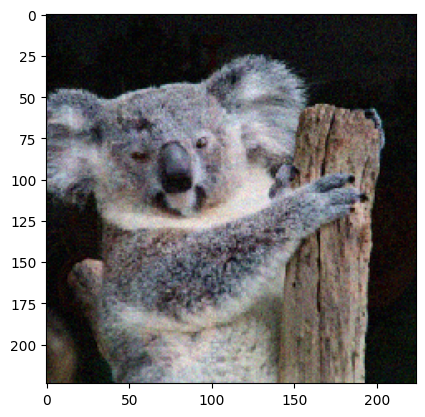

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1600. L2 error: 4781.61, Class label: 866, Class name: koala


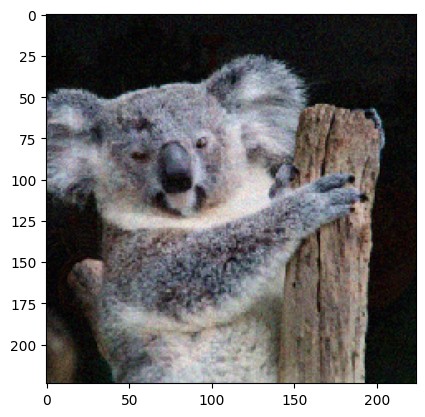

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1800. L2 error: 4385.14, Class label: 866, Class name: koala


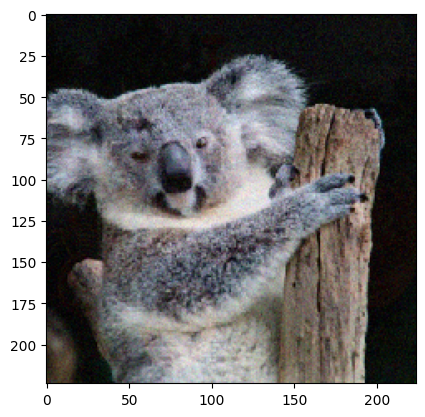

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 2000. L2 error: 3948.89, Class label: 866, Class name: koala


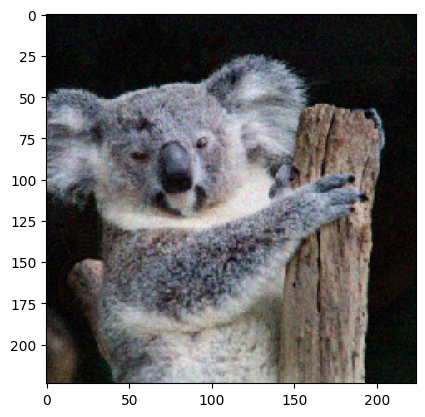

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 2200. L2 error: 3583.32, Class label: 866, Class name: koala


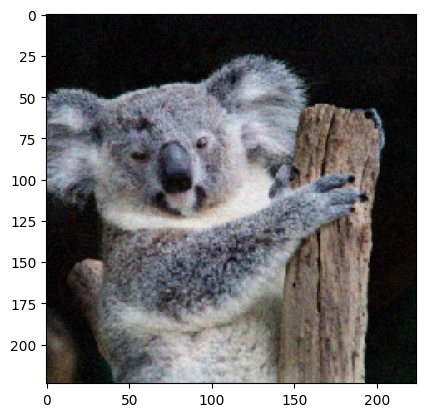

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 2400. L2 error: 3305.81, Class label: 866, Class name: koala


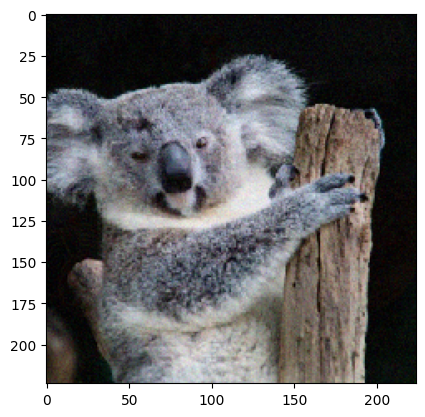

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 2600. L2 error: 3061.55, Class label: 866, Class name: koala


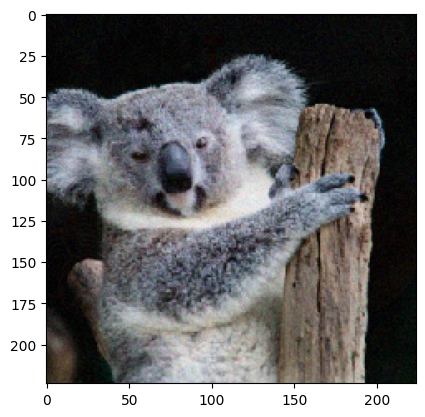

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 2800. L2 error: 2842.45, Class label: 866, Class name: koala


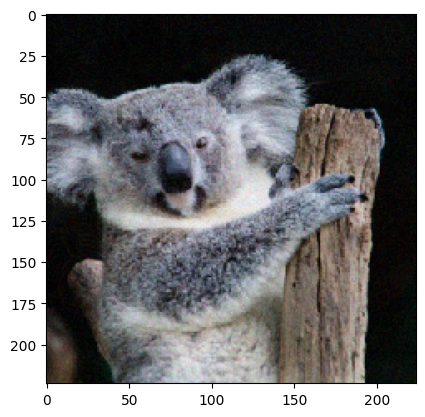

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 3000. L2 error: 2680.01, Class label: 866, Class name: koala


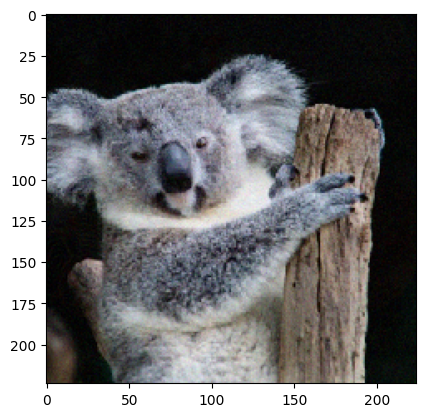

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 3200. L2 error: 2521.11, Class label: 866, Class name: koala


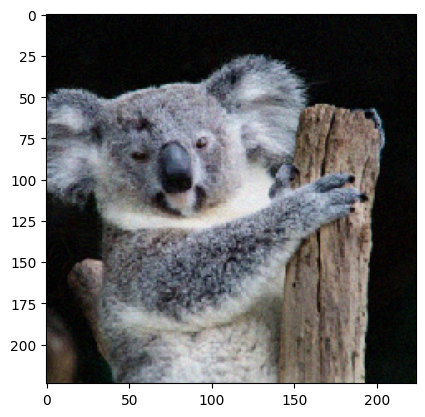

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 3400. L2 error: 2374.00, Class label: 866, Class name: koala


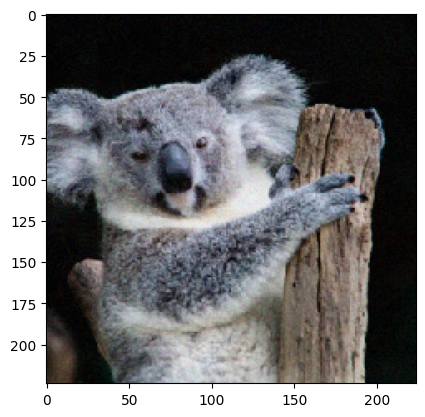

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 3600. L2 error: 2241.81, Class label: 866, Class name: koala


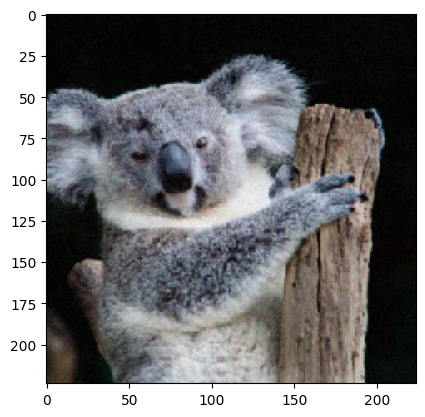

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 3800. L2 error: 2111.47, Class label: 866, Class name: koala


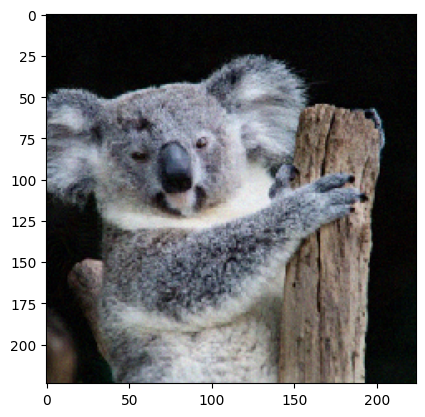

In [10]:
attack = BoundaryAttack(estimator=classifier, targeted=True, max_iter=0, delta=0.001, epsilon=0.001)
iter_step = 200
x_adv = np.array([init_image[..., ::-1]])

for i in range(20):
    x_adv = attack.generate(x=np.array([target_image[..., ::-1]]), y=to_categorical([866], 1000), x_adv_init=x_adv)

    l2_error = np.linalg.norm(np.reshape(x_adv[0] - target_image[..., ::-1], [-1]))
    class_label = np.argmax(classifier.predict(x_adv)[0])

    # Get the class predictions for the adversarial image
    class_name = get_image_predictions(x_adv[0])

    print("Adversarial image at step %d. L2 error: %.2f, Class label: %d, Class name: %s" %
     (i * iter_step, l2_error, class_label, class_name))

    plt.imshow(x_adv[0][..., ::-1].astype(np.uint))
    plt.show(block=False)

    if hasattr(attack, 'curr_delta') and hasattr(attack, 'curr_epsilon'):
        attack.max_iter = iter_step
        attack.delta = attack.curr_delta
        attack.epsilon = attack.curr_epsilon
    else:
        break

# Unsquared Images

Boundary attack supports inputs of unsquared images. The code in the following cell describes an example of creating a Resnet50-based classifier to attack unsquared images.

```python
# Adjust image shape here
image_shape = (224, 150)

mean_imagenet = np.zeros(tuple(list(image_shape) + [3]))
mean_imagenet[...,0].fill(103.939)
mean_imagenet[...,1].fill(116.779)
mean_imagenet[...,2].fill(123.68)

ones_array = np.ones_like(mean_imagenet)

model = ResNet50(weights='imagenet', input_shape=tuple(list(image_shape) + [3]), include_top=False)

def _kr_initialize(_, dtype=None):
    return k.variable(value=np.random.randn(np.prod(list(model.output.shape)[1:]).value, 1000))

head = model.output
head = Flatten()(head)
head = Dense(1000, kernel_initializer=_kr_initialize, bias_initializer=keras.initializers.Zeros())(head)
new_model = Model(inputs=model.input, outputs=head)

classifier = KerasClassifier(clip_values=(0, 255), model=new_model, preprocessing=(mean_imagenet, ones_array))
# Then call classifier.fit() to train the new weights
```